# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

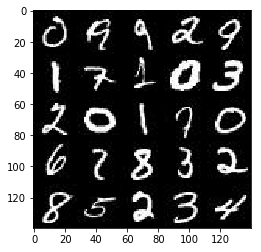

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

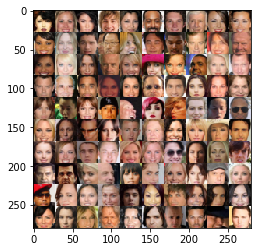

In [3]:
show_n_images = 100

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32,shape=(None,image_width,image_height,image_channels), name ="input_real")
    input_z = tf.placeholder(tf.float32,shape=(None,z_dim), name ="input_z")
    learning_rate = tf.placeholder(tf.float32,name="learning_rate")

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/home/carnd/anaconda3/en

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator',reuse = reuse):
        #Input layer is 28*28*3
        x1 = tf.layers.conv2d(images,128,5,strides=2,padding='same')
        relu1 = tf.maximum(0.2*x1,x1)
        #14*14*64
        #print('relu1')
        #print(x1.shape)
        
        x2 = tf.layers.conv2d(relu1,256,5,strides=2,padding='same')
        bn2 = tf.layers.batch_normalization(x2,training=True)
        relu2 = tf.maximum(0.2*bn2,bn2)
        #7*7*128
        #print('relu2')
        #print(relu2.shape)
        
        x3 = tf.layers.conv2d(relu2,512,5,strides=2,padding='same')
        bn3 = tf.layers.batch_normalization(x3,training=True)
        relu3 = tf.maximum(0.2*bn3,bn3)
        #4*4*256 
        #print('relu3')
        #print(relu3.shape)
        
        flat = tf.reshape(relu3,(-1,4*4*512))
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator',reuse=not is_train):
        alpha = 0.2
        x1 = tf.layers.dense(z,4*4*512)
        #reshape to start the convolutional stack
        x1 = tf.reshape(x1,(-1,4,4,512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1,x1)
        #4*4*512 now
        #print ('x1')
        #print (x1.shape)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 4 ,strides=1,padding='valid')
        x2 = tf.layers.batch_normalization(x2,training=is_train)
        x2 = tf.maximum(alpha*x2,x2)
        #7*7*256 now
        #print ('x2')
        #print (x2.shape)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5 ,strides=2,padding='same')
        x3 = tf.layers.batch_normalization(x3,training=is_train)
        x3 = tf.maximum(alpha*x3,x3)
        #14*14*128 now
        #print ('x3')
        #print (x3.shape)

        x4 = tf.layers.conv2d_transpose(x3, 64, 5 ,strides=1,padding='same')
        x4 = tf.layers.batch_normalization(x4,training=is_train)
        x4 = tf.maximum(alpha*x4,x4)
        #28*28*64 now
        #print ('x4')
        #print (x4.shape)
        
        logits =tf.layers.conv2d_transpose(x4, out_channel_dim ,5,strides=2,padding='same')
        #28*28*3 now
        #print ('logits')
        #print (logits.shape)
        
        out  = tf.tanh(logits)
           
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z,out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse = True)
    #nm can be improved
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real*0.9)) )
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
        
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    #Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss,var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss,var_list=g_vars)
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt,g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print_every = 50
    show_every = 25
    losses = []
    n_images = 25 
   
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps = steps+1
                batch_images = batch_images * 2.0                
                             
                # Random Noise for G
                batch_z = np.random.uniform(-1,1,size=(batch_size,z_dim))
                
                # Run Optimizers
                _ = sess.run(d_opt, feed_dict = {input_real:batch_images, input_z:batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict = {input_real:batch_images,input_z:batch_z, lr:learning_rate})
                
                if steps % print_every ==0:
                    train_loss_d = d_loss.eval({input_z:batch_z, input_real:batch_images})
                    train_loss_g = g_loss.eval({input_z:batch_z})
                    
                    print("Epoch {}/{}..." .format(epoch_i+1,epoch_count),
                    "Discriminator Loss: {:.4f}..." .format(train_loss_d),
                    "Generator Loss: {:.4f}" .format(train_loss_g))
                    
                    losses.append((train_loss_d,train_loss_g))
                
                if steps % show_every == 0:
                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode)
                
                
                    
                    
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

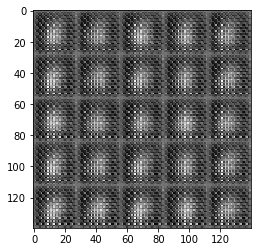

Epoch 1/2... Discriminator Loss: 0.9460... Generator Loss: 0.6666


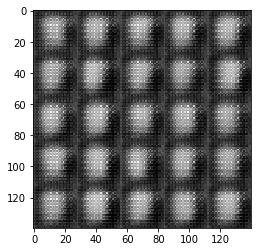

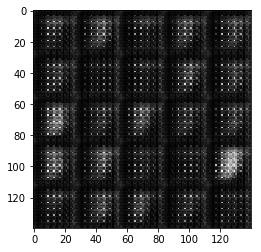

Epoch 1/2... Discriminator Loss: 0.2254... Generator Loss: 1.9567


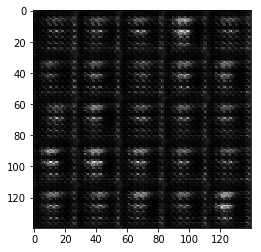

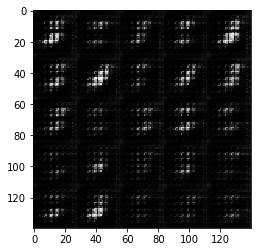

Epoch 1/2... Discriminator Loss: 0.5406... Generator Loss: 2.0000


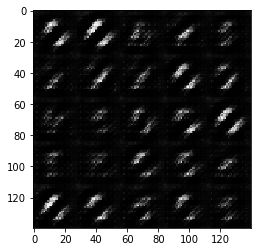

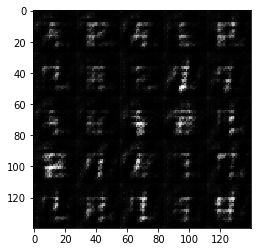

Epoch 1/2... Discriminator Loss: 1.0047... Generator Loss: 3.3263


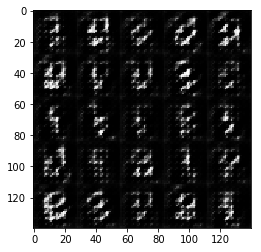

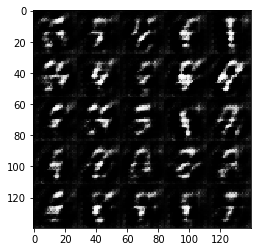

Epoch 1/2... Discriminator Loss: 1.1631... Generator Loss: 0.9031


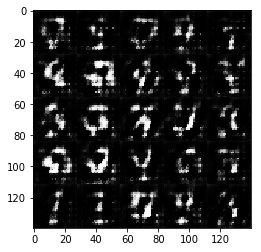

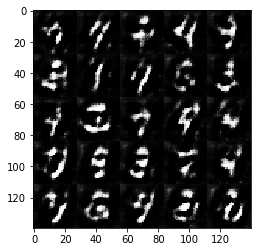

Epoch 1/2... Discriminator Loss: 1.0112... Generator Loss: 2.7033


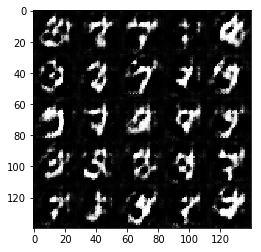

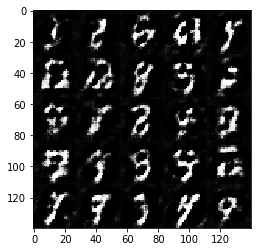

Epoch 1/2... Discriminator Loss: 1.0117... Generator Loss: 0.9055


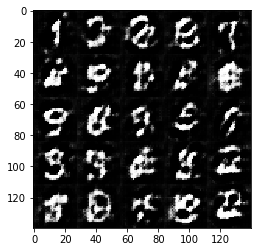

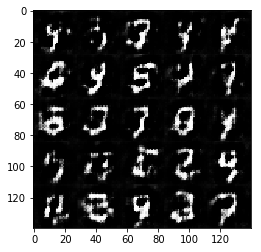

Epoch 1/2... Discriminator Loss: 1.1167... Generator Loss: 0.6374


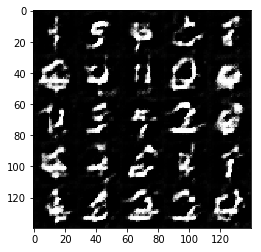

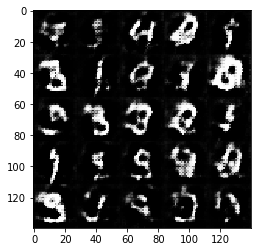

Epoch 1/2... Discriminator Loss: 0.9165... Generator Loss: 1.0865


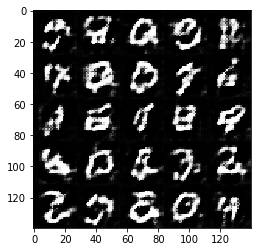

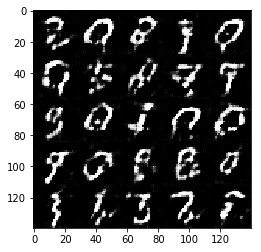

Epoch 1/2... Discriminator Loss: 1.1991... Generator Loss: 0.7005


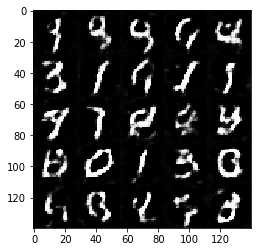

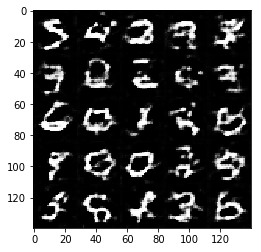

Epoch 1/2... Discriminator Loss: 1.3693... Generator Loss: 0.4325


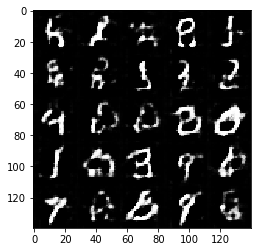

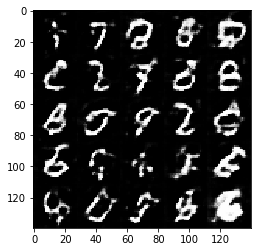

Epoch 1/2... Discriminator Loss: 0.8592... Generator Loss: 1.6557


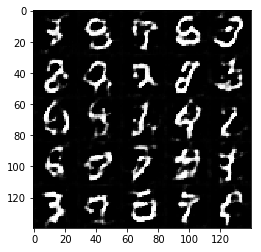

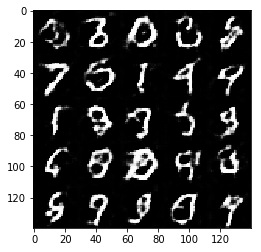

Epoch 1/2... Discriminator Loss: 1.1975... Generator Loss: 0.5456


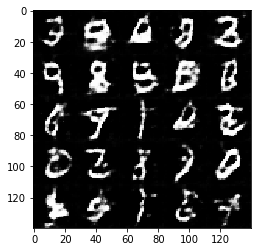

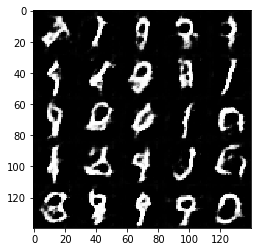

Epoch 1/2... Discriminator Loss: 2.1983... Generator Loss: 0.1869


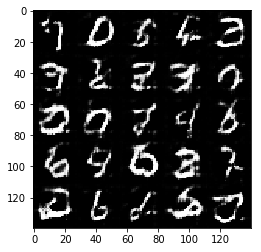

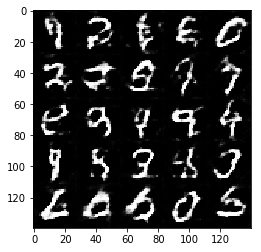

Epoch 1/2... Discriminator Loss: 1.1462... Generator Loss: 0.6760


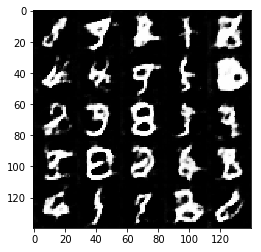

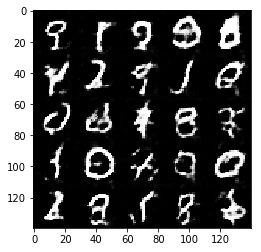

Epoch 1/2... Discriminator Loss: 0.8840... Generator Loss: 1.5917


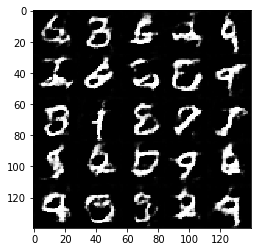

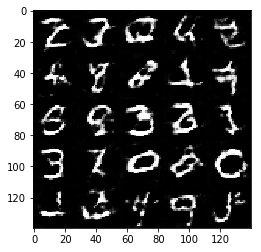

Epoch 1/2... Discriminator Loss: 1.9428... Generator Loss: 0.1909


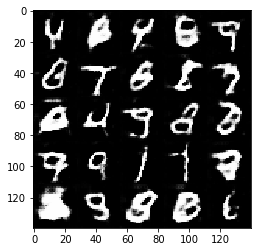

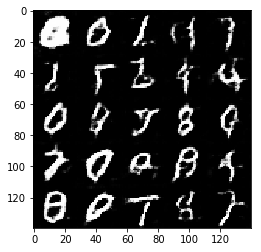

Epoch 1/2... Discriminator Loss: 1.0367... Generator Loss: 0.6373


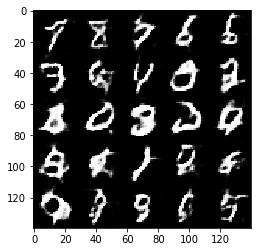

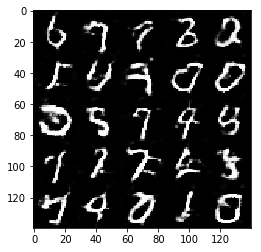

Epoch 1/2... Discriminator Loss: 1.0364... Generator Loss: 0.8206


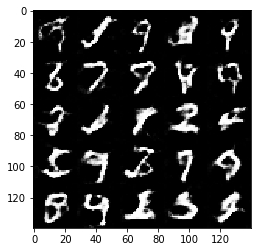

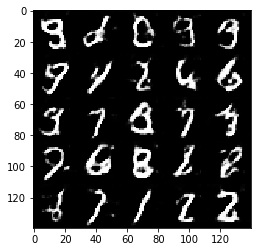

Epoch 1/2... Discriminator Loss: 0.9316... Generator Loss: 0.8351


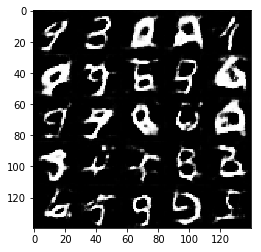

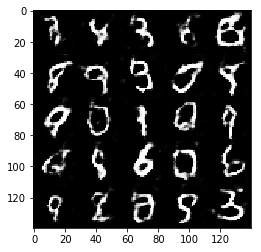

Epoch 1/2... Discriminator Loss: 1.2025... Generator Loss: 0.5506


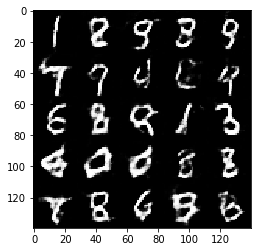

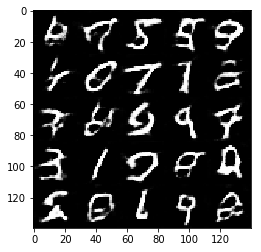

Epoch 1/2... Discriminator Loss: 1.7012... Generator Loss: 2.8329


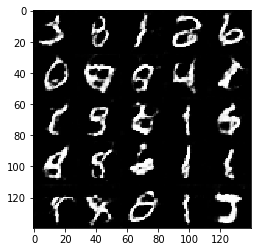

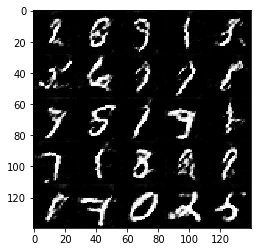

Epoch 1/2... Discriminator Loss: 0.9916... Generator Loss: 0.7426


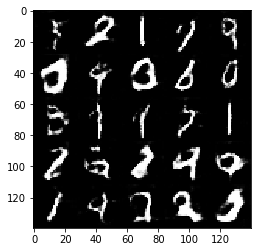

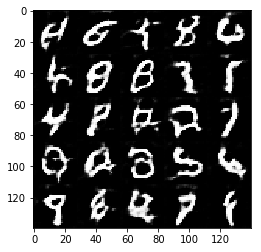

Epoch 1/2... Discriminator Loss: 1.0342... Generator Loss: 0.6192


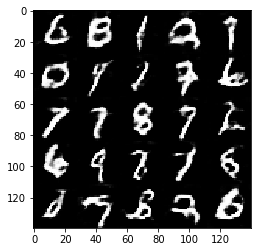

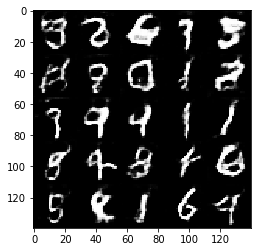

Epoch 1/2... Discriminator Loss: 0.8526... Generator Loss: 1.3458


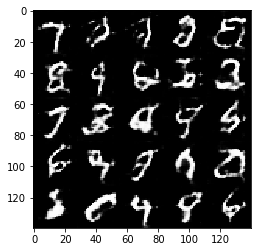

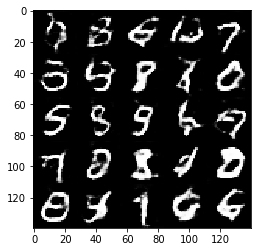

Epoch 1/2... Discriminator Loss: 0.8171... Generator Loss: 1.4397


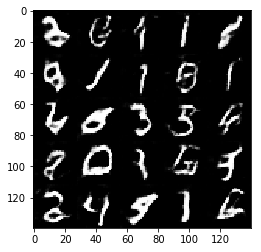

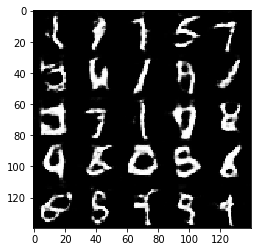

Epoch 1/2... Discriminator Loss: 0.9039... Generator Loss: 0.7564


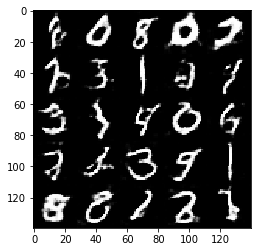

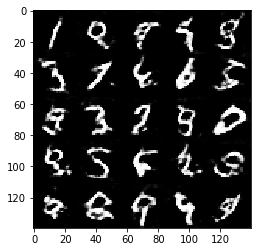

Epoch 1/2... Discriminator Loss: 0.8772... Generator Loss: 1.6256


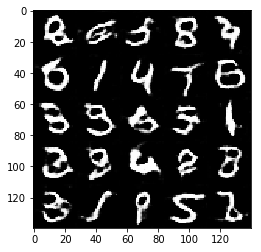

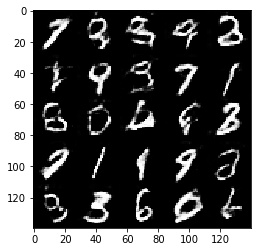

Epoch 1/2... Discriminator Loss: 1.7303... Generator Loss: 0.2707


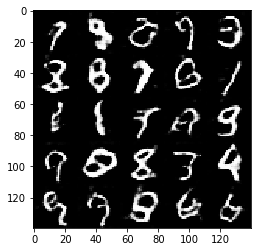

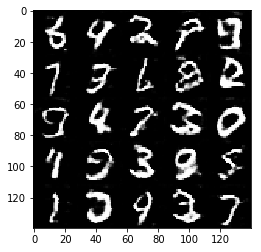

Epoch 1/2... Discriminator Loss: 0.7613... Generator Loss: 0.8973


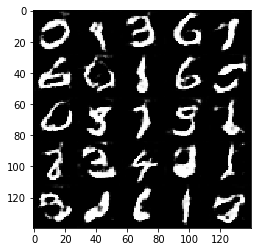

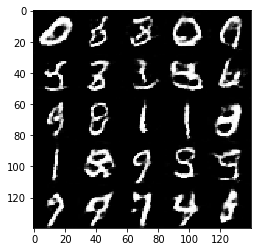

Epoch 1/2... Discriminator Loss: 1.1685... Generator Loss: 0.5675


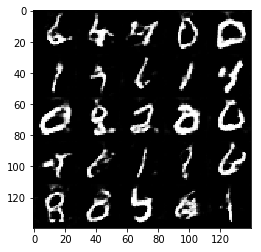

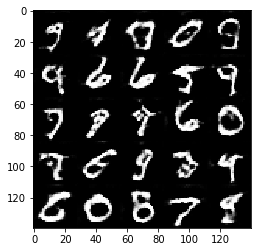

Epoch 1/2... Discriminator Loss: 0.8642... Generator Loss: 0.8251


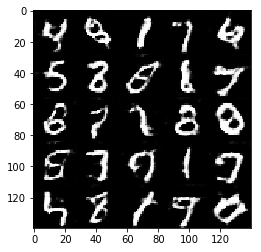

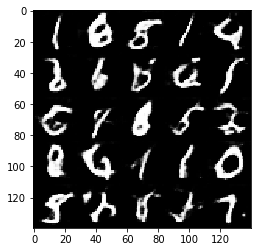

Epoch 1/2... Discriminator Loss: 1.4536... Generator Loss: 0.3758


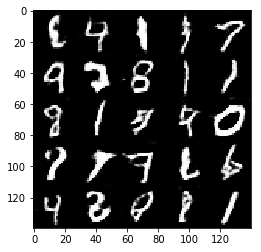

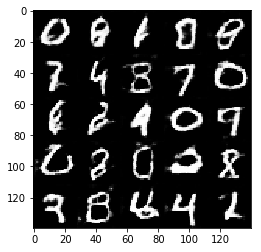

Epoch 1/2... Discriminator Loss: 1.2652... Generator Loss: 1.4020


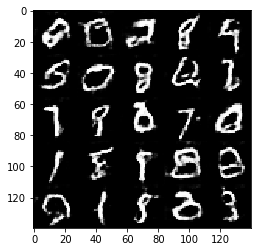

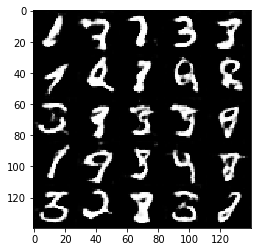

Epoch 1/2... Discriminator Loss: 1.0838... Generator Loss: 0.9620


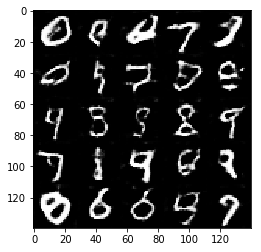

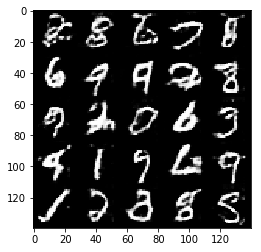

Epoch 1/2... Discriminator Loss: 1.1784... Generator Loss: 0.5429


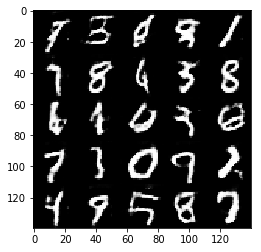

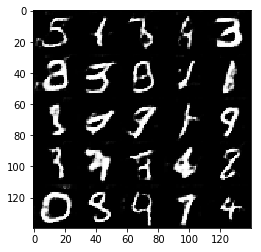

Epoch 1/2... Discriminator Loss: 0.8138... Generator Loss: 1.3049


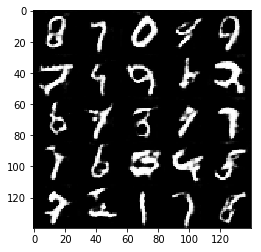

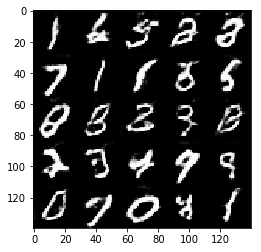

Epoch 2/2... Discriminator Loss: 1.1837... Generator Loss: 0.5495


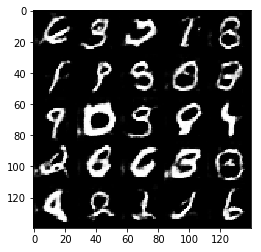

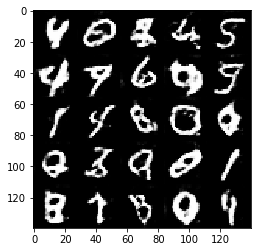

Epoch 2/2... Discriminator Loss: 3.1839... Generator Loss: 0.1310


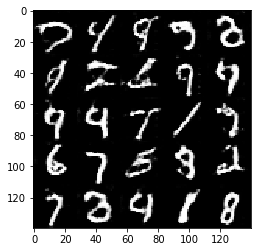

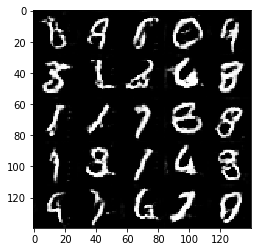

Epoch 2/2... Discriminator Loss: 0.6832... Generator Loss: 1.4804


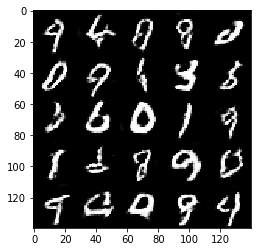

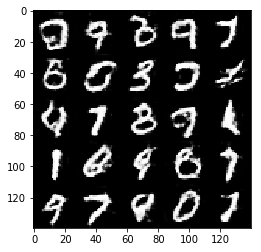

Epoch 2/2... Discriminator Loss: 0.7977... Generator Loss: 1.2463


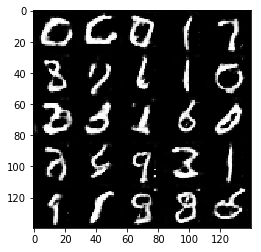

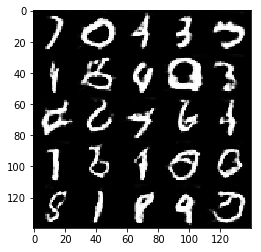

Epoch 2/2... Discriminator Loss: 0.9426... Generator Loss: 1.1594


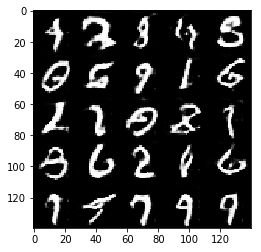

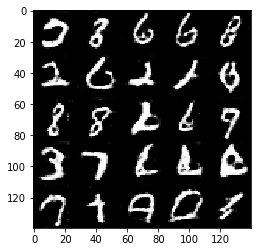

Epoch 2/2... Discriminator Loss: 0.9548... Generator Loss: 0.8513


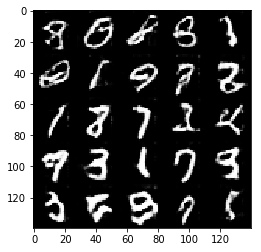

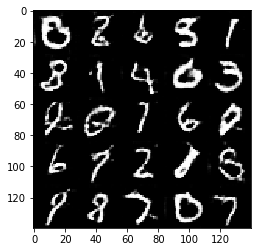

Epoch 2/2... Discriminator Loss: 1.0590... Generator Loss: 0.7727


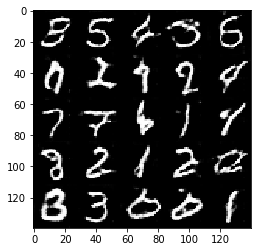

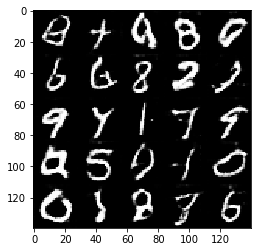

Epoch 2/2... Discriminator Loss: 0.5243... Generator Loss: 1.3773


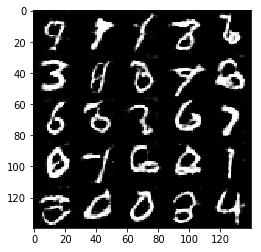

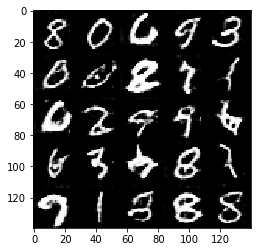

Epoch 2/2... Discriminator Loss: 1.1638... Generator Loss: 0.5048


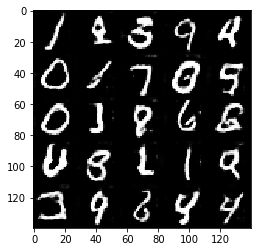

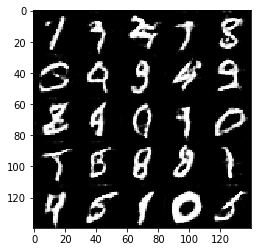

Epoch 2/2... Discriminator Loss: 0.7394... Generator Loss: 0.9647


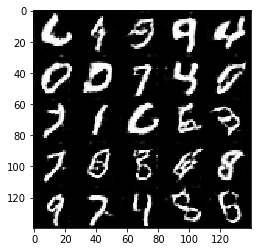

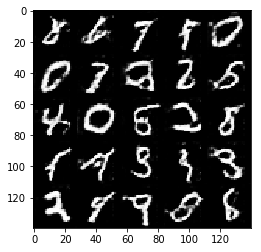

Epoch 2/2... Discriminator Loss: 0.8995... Generator Loss: 1.1311


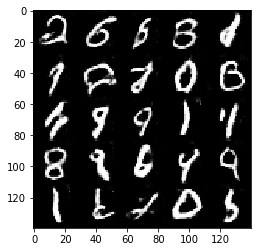

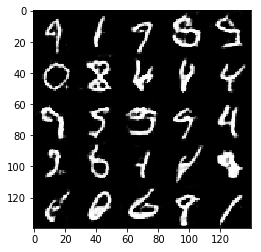

Epoch 2/2... Discriminator Loss: 0.6711... Generator Loss: 1.0906


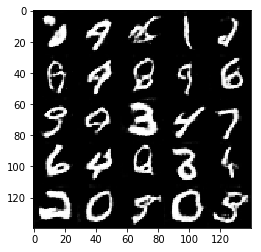

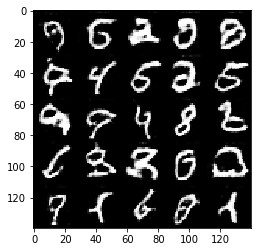

Epoch 2/2... Discriminator Loss: 0.7185... Generator Loss: 2.6367


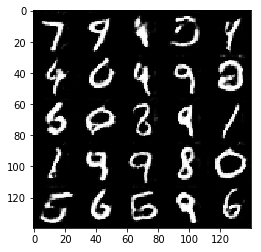

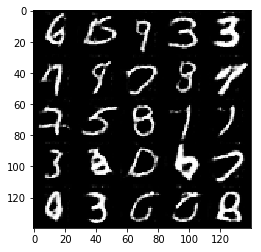

Epoch 2/2... Discriminator Loss: 1.7369... Generator Loss: 0.3030


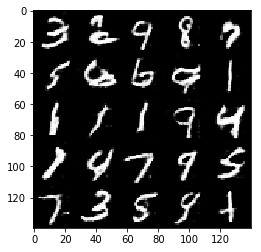

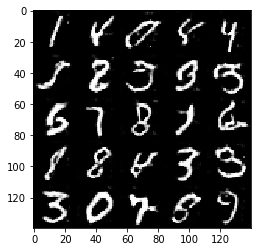

Epoch 2/2... Discriminator Loss: 2.0971... Generator Loss: 2.9706


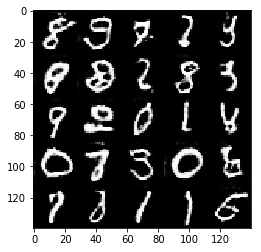

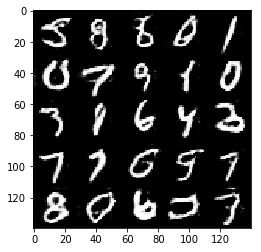

Epoch 2/2... Discriminator Loss: 1.0397... Generator Loss: 0.6501


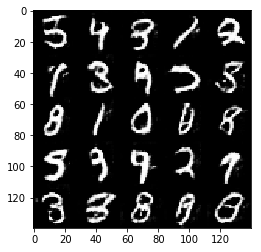

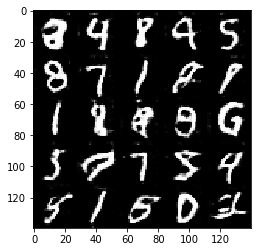

Epoch 2/2... Discriminator Loss: 0.8137... Generator Loss: 1.0832


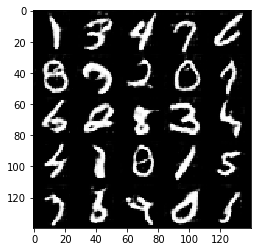

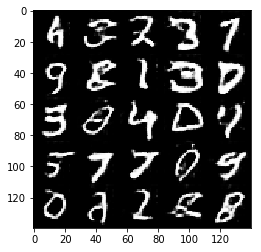

Epoch 2/2... Discriminator Loss: 0.6943... Generator Loss: 1.3228


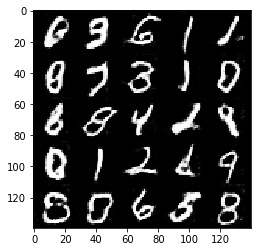

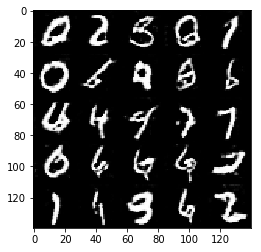

Epoch 2/2... Discriminator Loss: 0.4374... Generator Loss: 1.5761


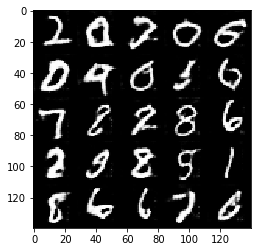

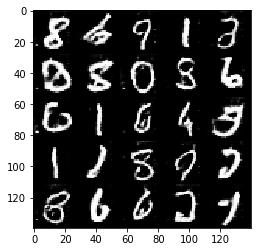

Epoch 2/2... Discriminator Loss: 0.7146... Generator Loss: 1.4560


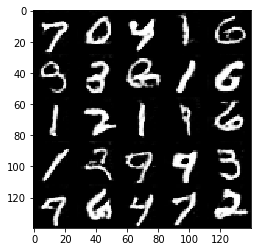

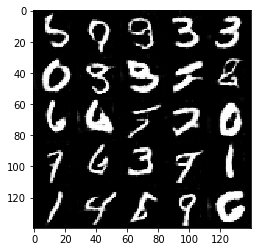

Epoch 2/2... Discriminator Loss: 1.3124... Generator Loss: 0.5459


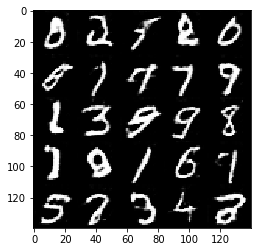

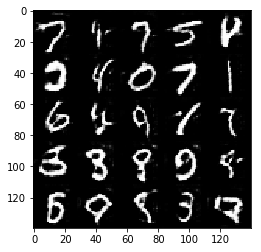

Epoch 2/2... Discriminator Loss: 0.9363... Generator Loss: 0.9877


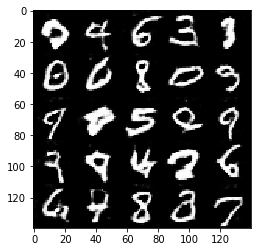

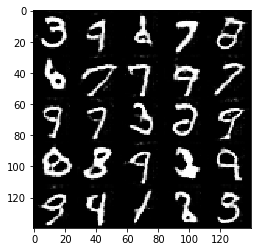

Epoch 2/2... Discriminator Loss: 1.0284... Generator Loss: 0.6768


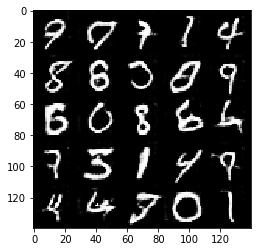

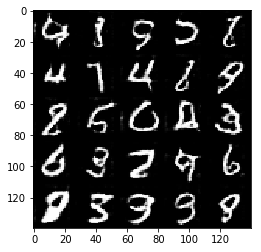

Epoch 2/2... Discriminator Loss: 0.6828... Generator Loss: 1.3870


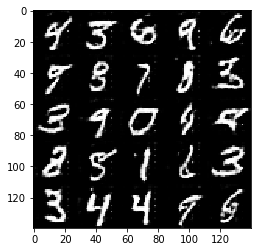

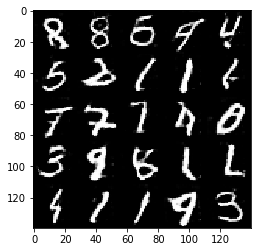

Epoch 2/2... Discriminator Loss: 1.0605... Generator Loss: 0.7244


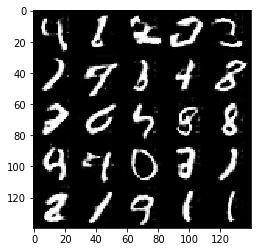

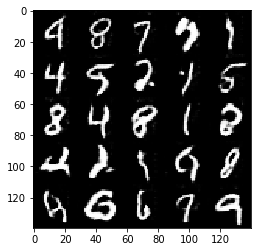

Epoch 2/2... Discriminator Loss: 1.1396... Generator Loss: 0.6584


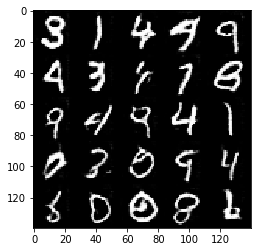

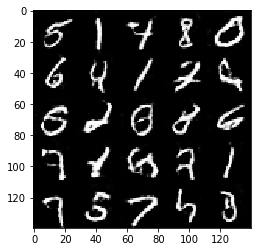

Epoch 2/2... Discriminator Loss: 0.8308... Generator Loss: 0.7915


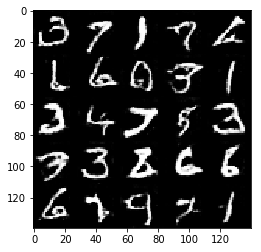

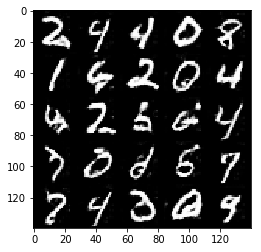

Epoch 2/2... Discriminator Loss: 1.2091... Generator Loss: 0.6063


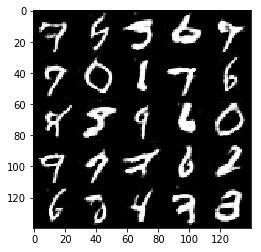

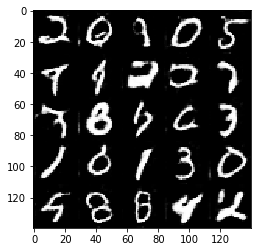

Epoch 2/2... Discriminator Loss: 0.6989... Generator Loss: 1.1148


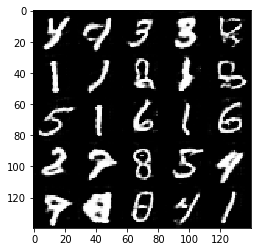

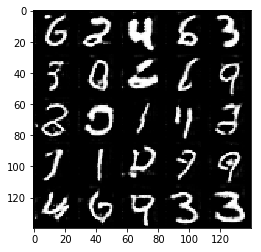

Epoch 2/2... Discriminator Loss: 0.8121... Generator Loss: 0.8614


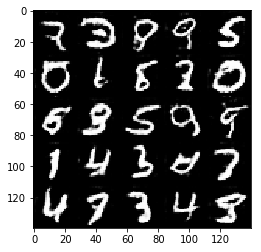

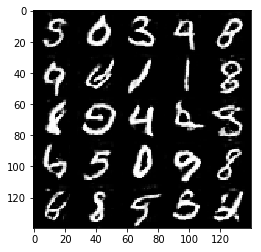

Epoch 2/2... Discriminator Loss: 0.7668... Generator Loss: 0.8096


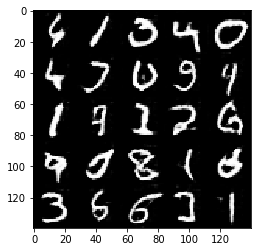

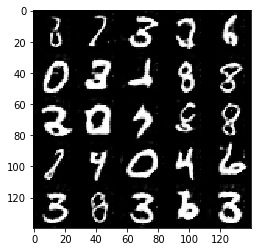

Epoch 2/2... Discriminator Loss: 0.6559... Generator Loss: 1.1605


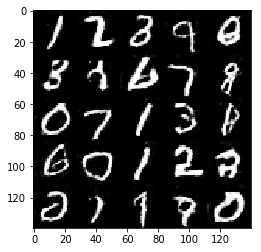

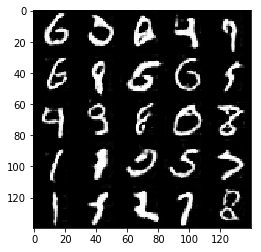

Epoch 2/2... Discriminator Loss: 0.5147... Generator Loss: 1.6716


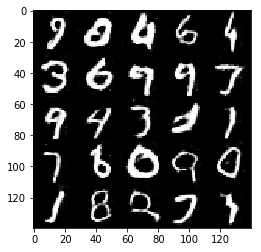

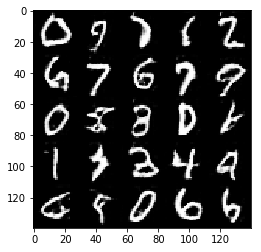

Epoch 2/2... Discriminator Loss: 0.7773... Generator Loss: 0.9179


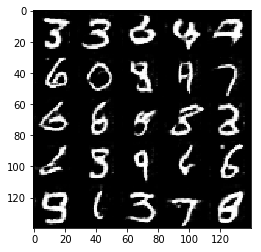

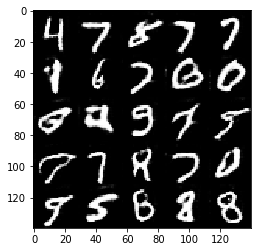

Epoch 2/2... Discriminator Loss: 0.7482... Generator Loss: 1.0360


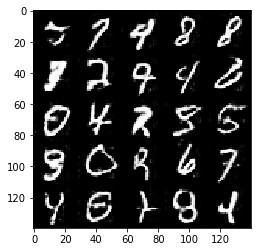

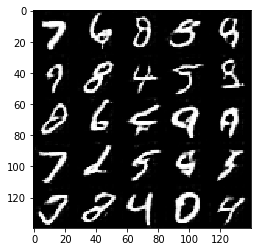

Epoch 2/2... Discriminator Loss: 0.6118... Generator Loss: 1.0840


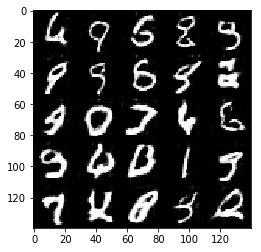

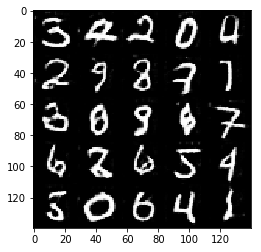

Epoch 2/2... Discriminator Loss: 1.4410... Generator Loss: 0.5311


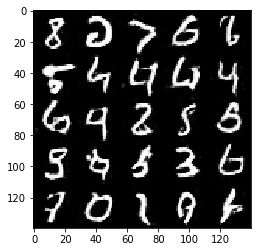

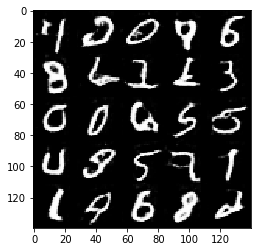

Epoch 2/2... Discriminator Loss: 0.3862... Generator Loss: 1.7033


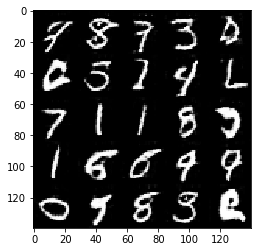

In [12]:
batch_size = 32
z_dim = 100
learning_rate = .0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

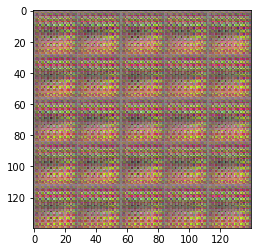

Epoch 1/1... Discriminator Loss: 0.7757... Generator Loss: 12.8162


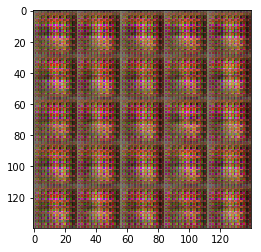

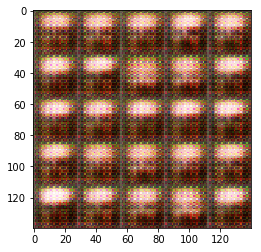

Epoch 1/1... Discriminator Loss: 0.2207... Generator Loss: 2.0708


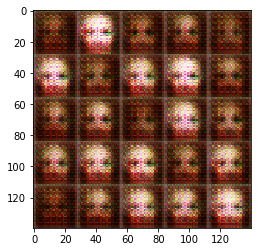

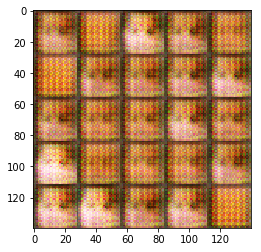

Epoch 1/1... Discriminator Loss: 0.8725... Generator Loss: 1.1664


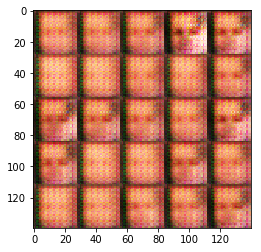

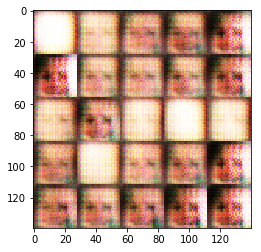

Epoch 1/1... Discriminator Loss: 0.8042... Generator Loss: 1.0713


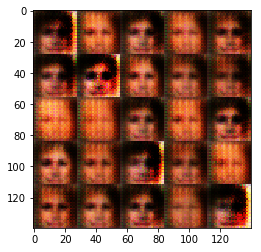

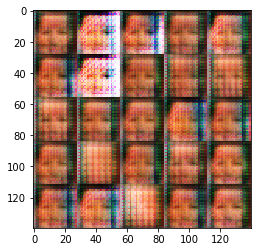

Epoch 1/1... Discriminator Loss: 1.1157... Generator Loss: 1.3414


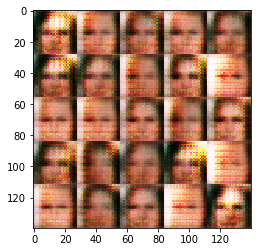

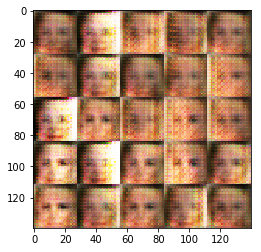

Epoch 1/1... Discriminator Loss: 1.7031... Generator Loss: 0.4375


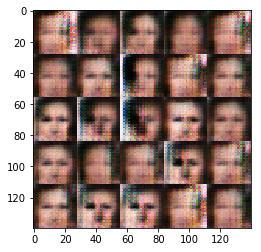

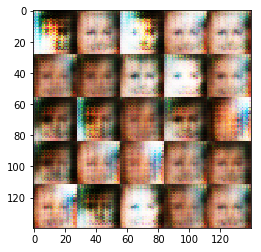

Epoch 1/1... Discriminator Loss: 0.9930... Generator Loss: 0.6750


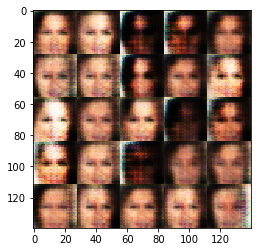

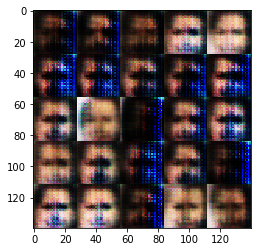

Epoch 1/1... Discriminator Loss: 0.6512... Generator Loss: 2.0888


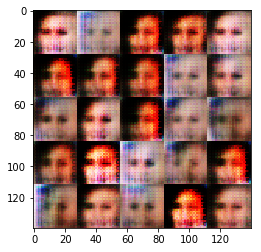

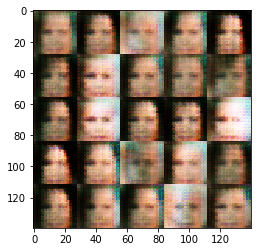

Epoch 1/1... Discriminator Loss: 1.9999... Generator Loss: 0.3494


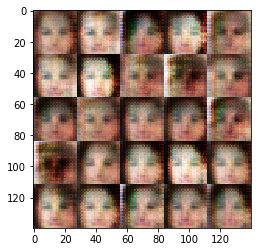

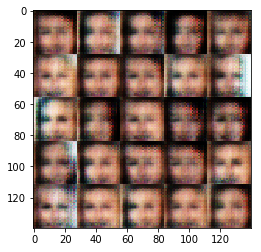

Epoch 1/1... Discriminator Loss: 1.1345... Generator Loss: 0.6732


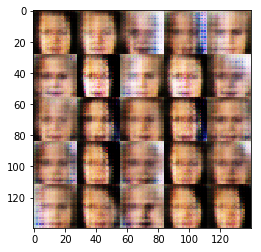

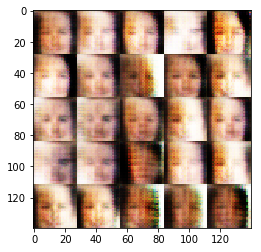

Epoch 1/1... Discriminator Loss: 0.7553... Generator Loss: 0.8975


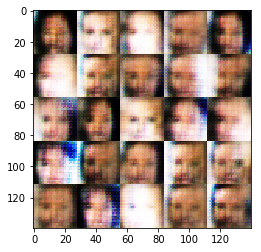

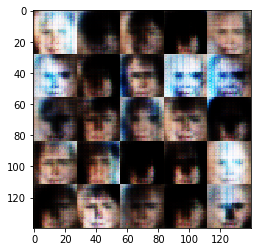

Epoch 1/1... Discriminator Loss: 1.2637... Generator Loss: 0.6051


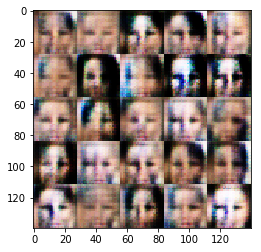

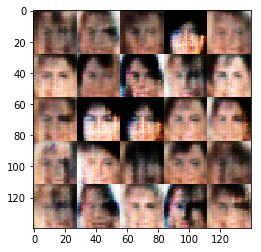

Epoch 1/1... Discriminator Loss: 0.4825... Generator Loss: 5.0702


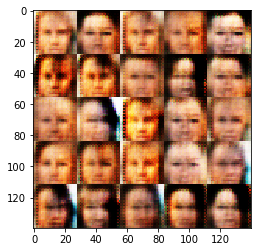

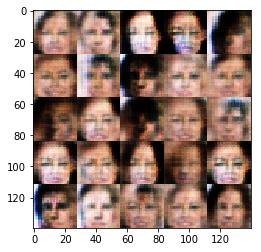

Epoch 1/1... Discriminator Loss: 0.4164... Generator Loss: 2.3578


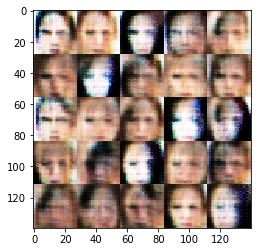

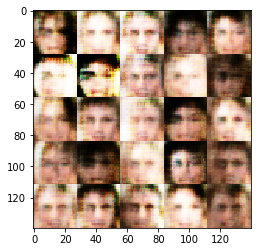

Epoch 1/1... Discriminator Loss: 1.4001... Generator Loss: 0.5140


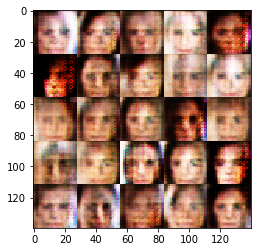

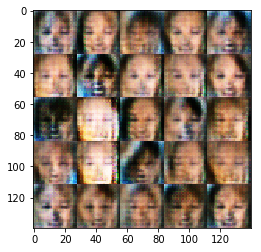

Epoch 1/1... Discriminator Loss: 0.2011... Generator Loss: 3.7708


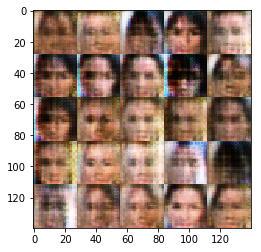

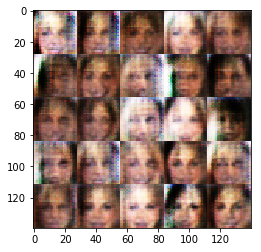

Epoch 1/1... Discriminator Loss: 0.9679... Generator Loss: 0.7209


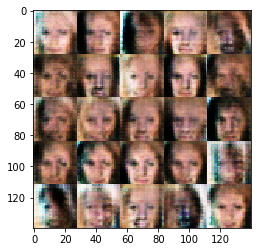

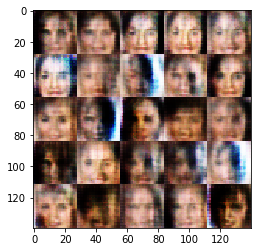

Epoch 1/1... Discriminator Loss: 0.8325... Generator Loss: 1.0623


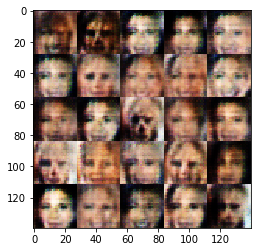

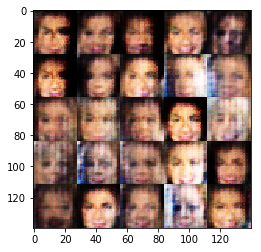

Epoch 1/1... Discriminator Loss: 0.4426... Generator Loss: 1.9171


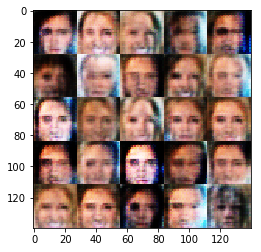

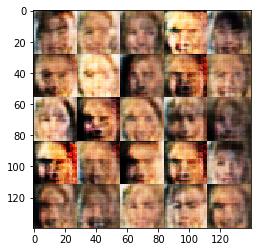

Epoch 1/1... Discriminator Loss: 0.5902... Generator Loss: 1.6121


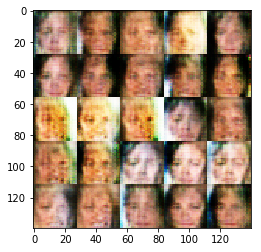

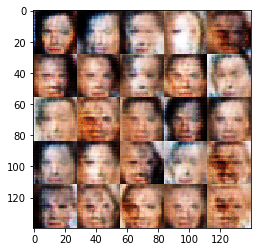

Epoch 1/1... Discriminator Loss: 0.5423... Generator Loss: 1.5174


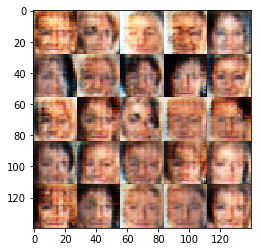

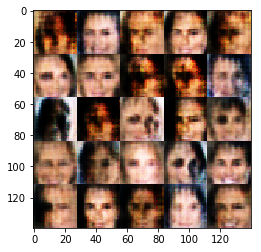

Epoch 1/1... Discriminator Loss: 0.5243... Generator Loss: 1.3610


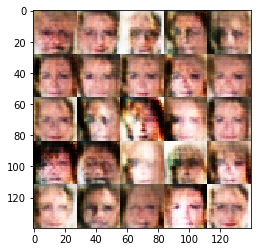

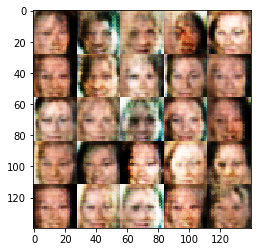

Epoch 1/1... Discriminator Loss: 0.6714... Generator Loss: 1.4071


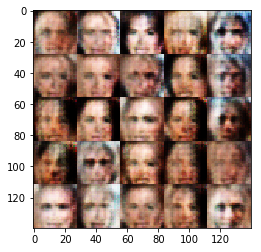

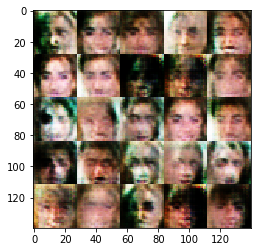

Epoch 1/1... Discriminator Loss: 0.3596... Generator Loss: 1.6632


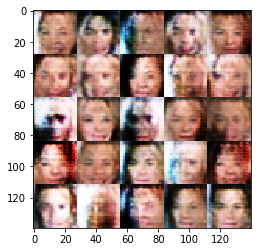

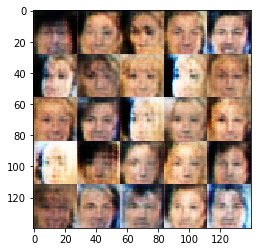

Epoch 1/1... Discriminator Loss: 1.6004... Generator Loss: 3.5842


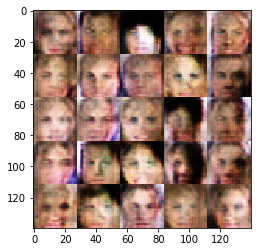

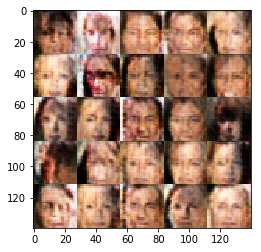

Epoch 1/1... Discriminator Loss: 1.3044... Generator Loss: 0.6300


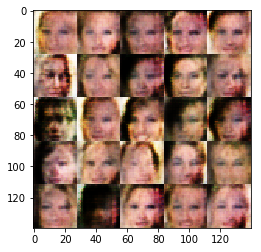

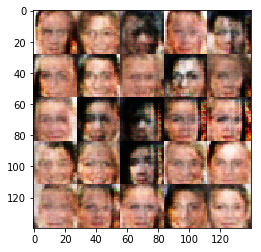

Epoch 1/1... Discriminator Loss: 0.4938... Generator Loss: 1.5332


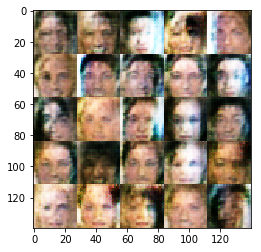

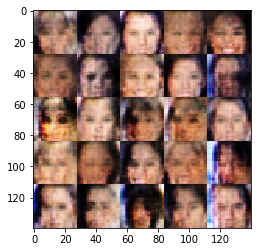

Epoch 1/1... Discriminator Loss: 0.8170... Generator Loss: 1.0570


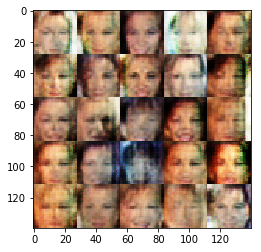

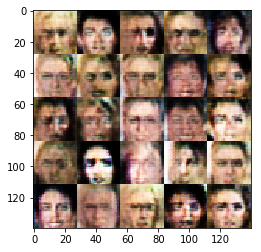

Epoch 1/1... Discriminator Loss: 1.0527... Generator Loss: 0.7436


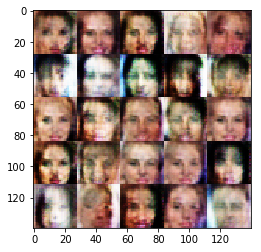

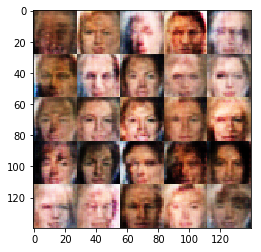

Epoch 1/1... Discriminator Loss: 0.7427... Generator Loss: 1.6695


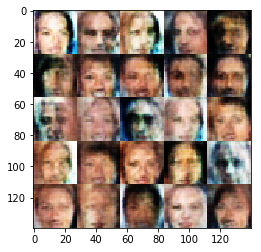

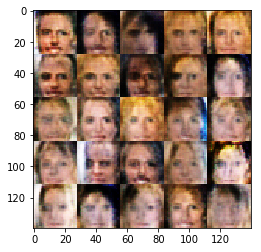

Epoch 1/1... Discriminator Loss: 0.5443... Generator Loss: 2.0472


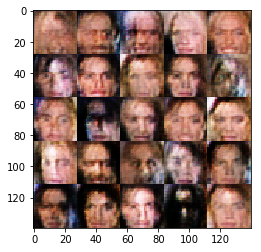

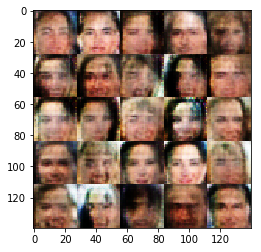

Epoch 1/1... Discriminator Loss: 0.9293... Generator Loss: 1.5047


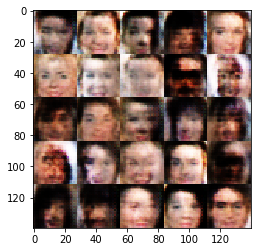

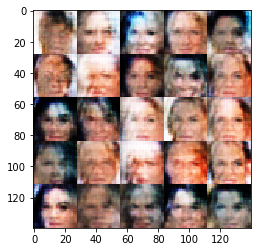

Epoch 1/1... Discriminator Loss: 0.5096... Generator Loss: 1.5027


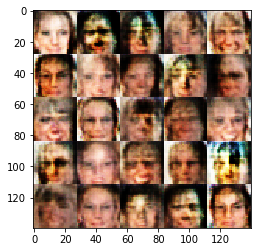

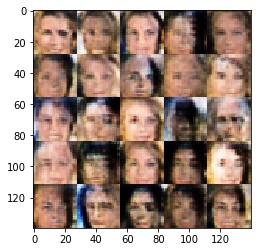

Epoch 1/1... Discriminator Loss: 0.8138... Generator Loss: 0.9101


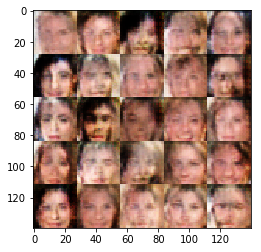

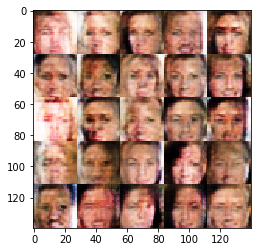

Epoch 1/1... Discriminator Loss: 0.5675... Generator Loss: 1.3377


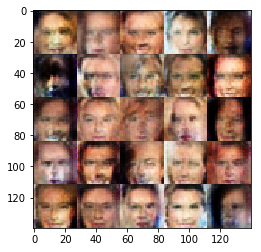

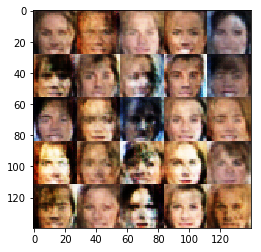

Epoch 1/1... Discriminator Loss: 0.8491... Generator Loss: 0.8226


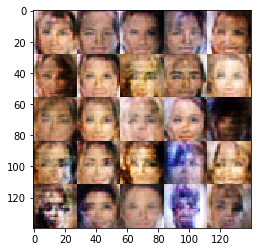

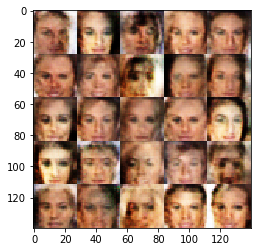

Epoch 1/1... Discriminator Loss: 0.7764... Generator Loss: 1.1364


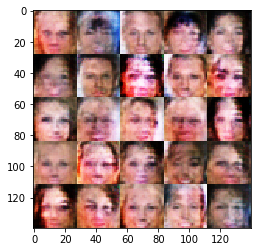

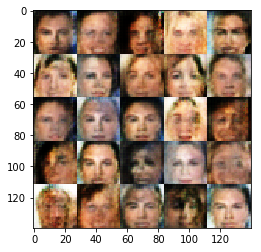

Epoch 1/1... Discriminator Loss: 0.7926... Generator Loss: 1.0402


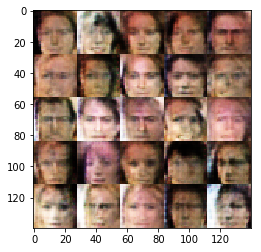

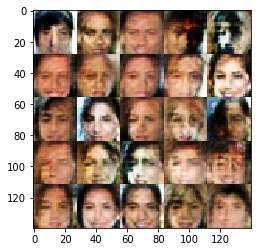

Epoch 1/1... Discriminator Loss: 0.8224... Generator Loss: 1.1397


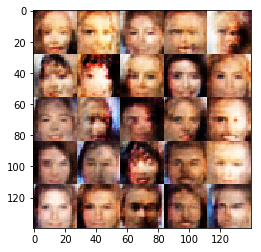

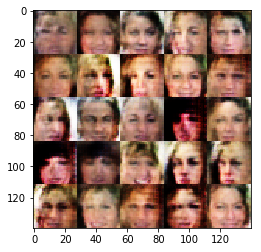

Epoch 1/1... Discriminator Loss: 1.7064... Generator Loss: 0.3208


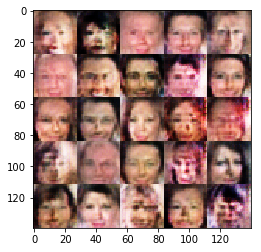

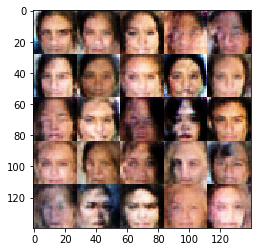

Epoch 1/1... Discriminator Loss: 1.1645... Generator Loss: 2.1255


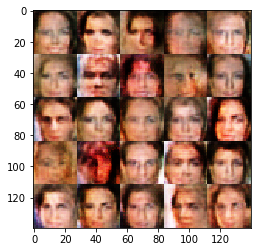

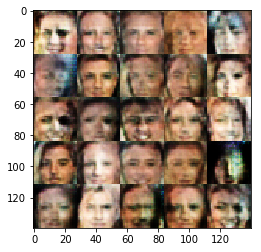

Epoch 1/1... Discriminator Loss: 0.7202... Generator Loss: 1.1616


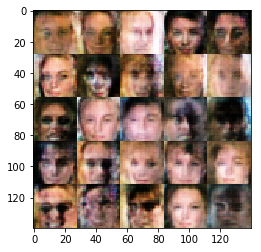

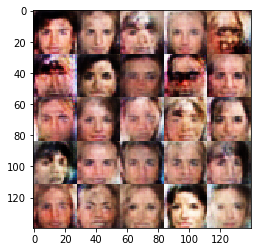

Epoch 1/1... Discriminator Loss: 0.9499... Generator Loss: 1.3357


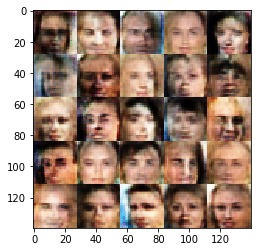

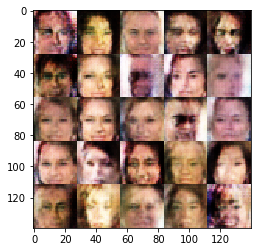

Epoch 1/1... Discriminator Loss: 1.0292... Generator Loss: 2.4601


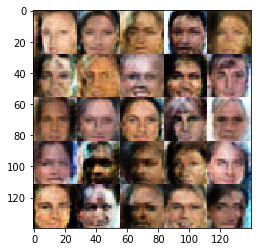

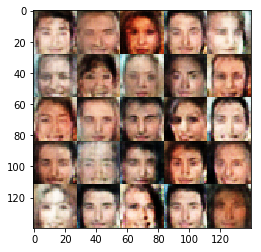

Epoch 1/1... Discriminator Loss: 0.9495... Generator Loss: 1.5041


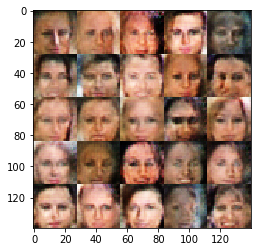

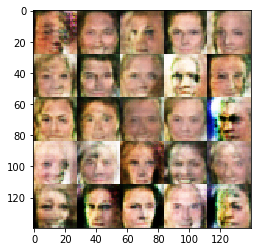

Epoch 1/1... Discriminator Loss: 1.0597... Generator Loss: 0.9654


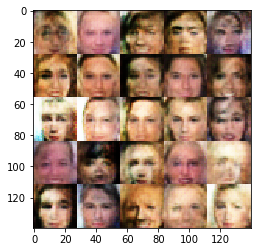

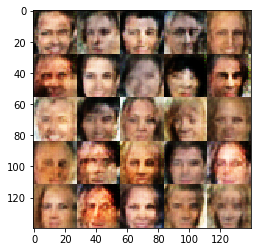

Epoch 1/1... Discriminator Loss: 1.4100... Generator Loss: 0.4554


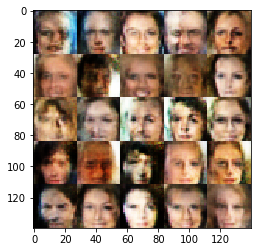

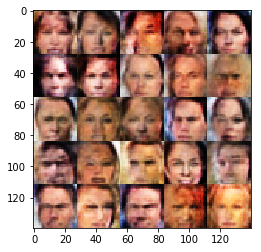

Epoch 1/1... Discriminator Loss: 0.8567... Generator Loss: 2.2076


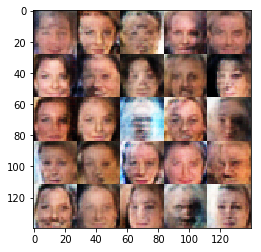

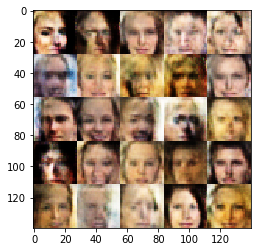

Epoch 1/1... Discriminator Loss: 0.8977... Generator Loss: 1.4698


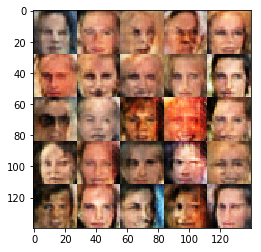

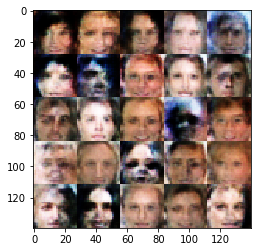

Epoch 1/1... Discriminator Loss: 0.8961... Generator Loss: 1.0811


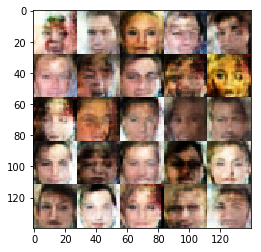

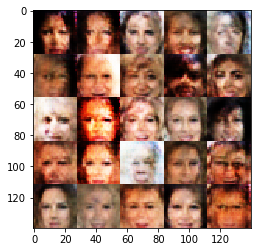

Epoch 1/1... Discriminator Loss: 1.2187... Generator Loss: 0.8907


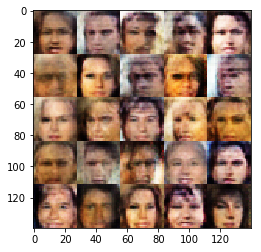

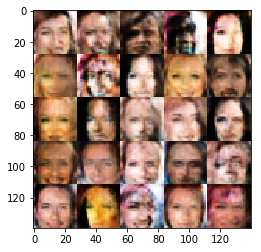

Epoch 1/1... Discriminator Loss: 1.1238... Generator Loss: 0.5694


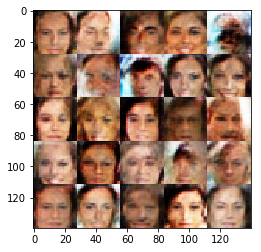

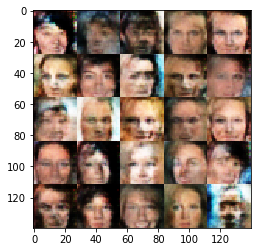

Epoch 1/1... Discriminator Loss: 0.7591... Generator Loss: 1.0555


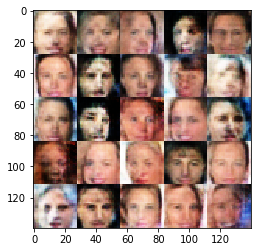

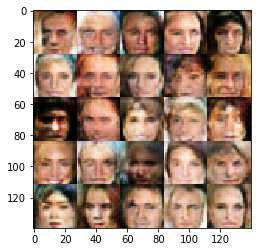

Epoch 1/1... Discriminator Loss: 0.9062... Generator Loss: 1.1670


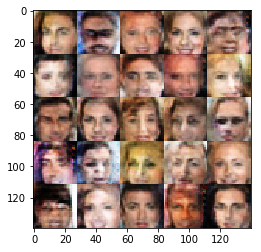

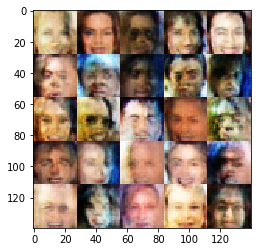

Epoch 1/1... Discriminator Loss: 0.8437... Generator Loss: 0.8433


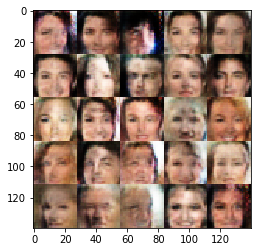

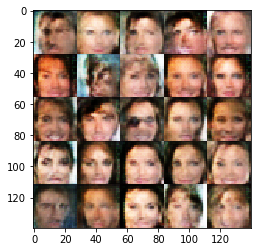

Epoch 1/1... Discriminator Loss: 0.7862... Generator Loss: 1.2516


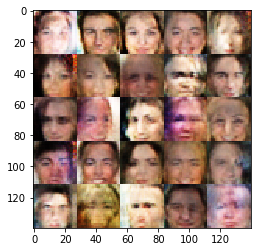

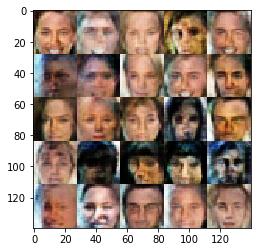

Epoch 1/1... Discriminator Loss: 1.1198... Generator Loss: 2.1869


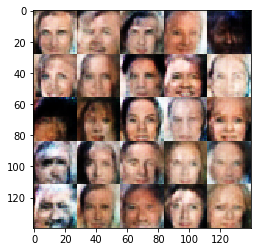

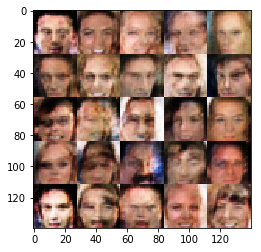

Epoch 1/1... Discriminator Loss: 0.4110... Generator Loss: 1.4665


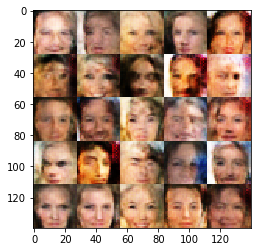

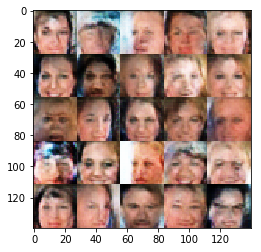

Epoch 1/1... Discriminator Loss: 1.1182... Generator Loss: 1.6778


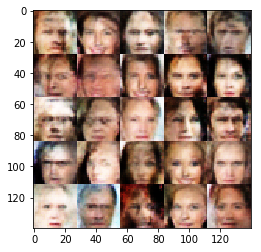

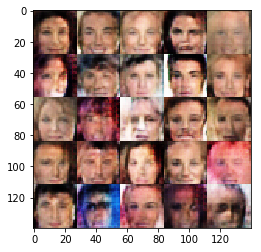

Epoch 1/1... Discriminator Loss: 0.6311... Generator Loss: 1.4614


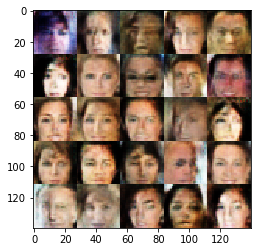

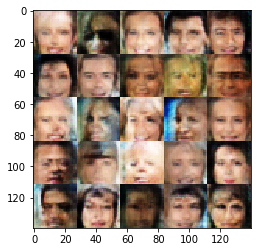

Epoch 1/1... Discriminator Loss: 0.7640... Generator Loss: 1.1631


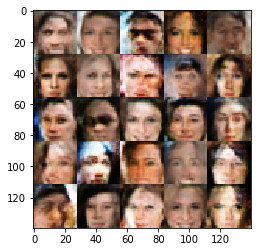

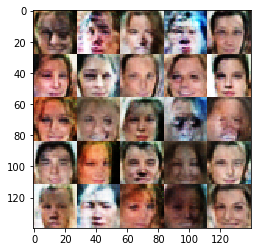

Epoch 1/1... Discriminator Loss: 1.0261... Generator Loss: 0.7735


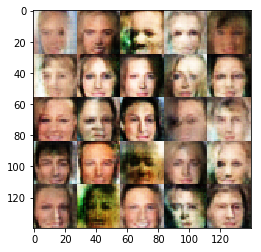

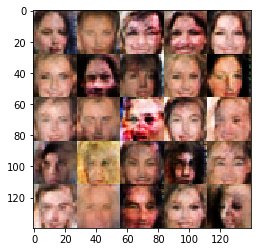

Epoch 1/1... Discriminator Loss: 1.3149... Generator Loss: 0.4121


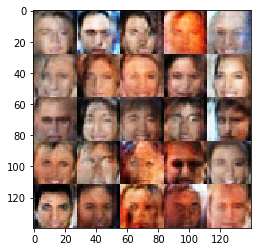

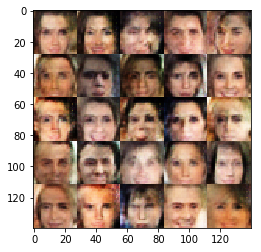

Epoch 1/1... Discriminator Loss: 1.2922... Generator Loss: 0.4942


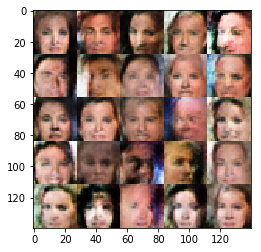

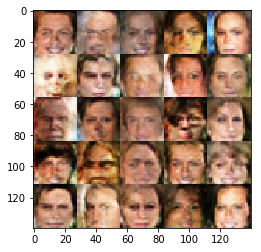

Epoch 1/1... Discriminator Loss: 0.8971... Generator Loss: 2.8493


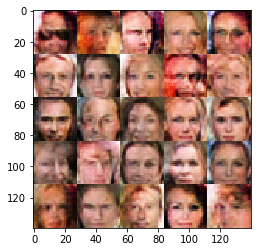

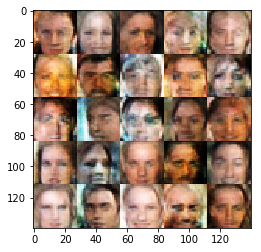

Epoch 1/1... Discriminator Loss: 0.9050... Generator Loss: 1.0099


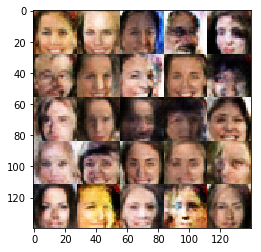

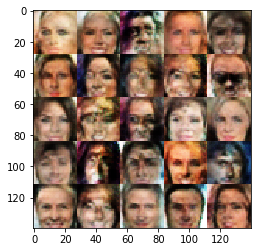

Epoch 1/1... Discriminator Loss: 1.0273... Generator Loss: 0.8251


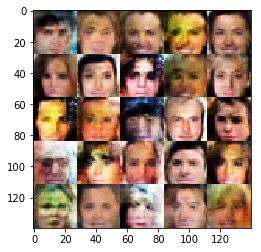

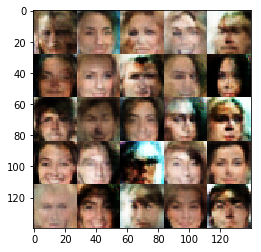

Epoch 1/1... Discriminator Loss: 0.8224... Generator Loss: 1.8095


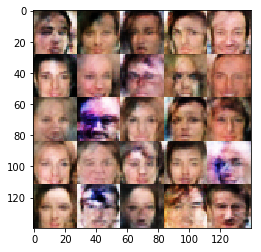

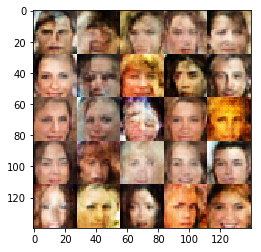

Epoch 1/1... Discriminator Loss: 0.3834... Generator Loss: 1.8186


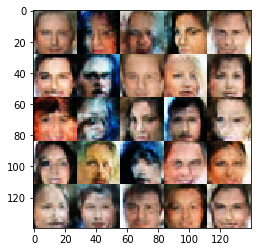

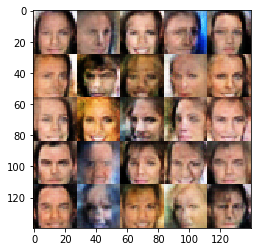

Epoch 1/1... Discriminator Loss: 1.4451... Generator Loss: 0.3473


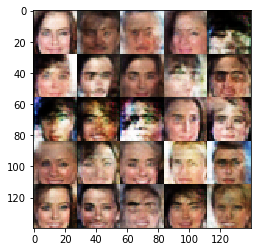

KeyboardInterrupt: 

In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.